In [127]:
import tensorflow as tf
from pathlib import Path
import tensorflow_io as tfio
from tensorflow import keras
from tensorflow.experimental.numpy import log10
import matplotlib.pyplot as plt
import random
from ipywidgets import widgets as w
from IPython.display import display, Audio
import os
import math
import tensorflow_addons as tfa

In [82]:
path  = Path('../DeepShip/')

# Organize dataset

In [83]:
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-csmiid8b
  Running command git clone --filter=blob:none --quiet https://www.github.com/keras-team/keras-contrib.git /tmp/pip-req-build-csmiid8b
  Resolved https://www.github.com/keras-team/keras-contrib.git to commit 3fc5ef709e061416f4bc8a92ca3750c824b5d2b0
  Preparing metadata (setup.py) ... done


In [84]:
for f in path.iterdir():
    print(f)

../DeepShip/Tug
../DeepShip/Cargo
../DeepShip/Tanker
../DeepShip/Passengership


In [85]:
classes = [f.stem for f in path.iterdir()]

In [86]:
for i in enumerate(classes) :
    print (i)

(0, 'Tug')
(1, 'Cargo')
(2, 'Tanker')
(3, 'Passengership')


In [87]:
label_id = {c: i for i,c in enumerate(classes) }; label_id

{'Tug': 0, 'Cargo': 1, 'Tanker': 2, 'Passengership': 3}

In [88]:
for c in classes:
    print(f'{c}: {len(list((path/c).glob("*/*.wav")))}')

Tug: 69
Cargo: 109
Tanker: 240
Passengership: 191


## Oversample tug and cargo

In [89]:
data = {c: list((path/c).glob("*/*.wav")) for c in classes}

In [90]:
for c in classes:
    random.shuffle(data[c])

In [91]:
valid_data = {c: data[c][:len(data[c])//5] for c in classes}

In [92]:
train_data = {c: data[c][len(data[c])//5:] for c in classes}

In [93]:
#valid_data["Tug"] = valid_data["Tug"]*3
train_data["Tug"] = train_data["Tug"]*3
#valid_data["Cargo"] = valid_data["Cargo"]*2
train_data["Cargo"] = train_data["Cargo"]*2

In [94]:
train = []
valid = []
for c in classes:
    train += train_data[c]
    valid += valid_data[c]

In [95]:
len(train), len(valid)

(689, 120)

In [96]:
train = list(map(str, train))
valid = list(map(str, valid))

In [97]:
random.shuffle(train)

In [98]:
random.shuffle(valid)

from keras_contrib.# Read audio files

In [99]:
def get_label(path):
    if not isinstance(path, Path): path = Path(path)
    return path.parents[1].stem

In [100]:
def get_label_id(path):
    return label_id[get_label(path)]import tensorflow_addons as tfa

In [101]:
def read_file(path):
    audio = tfio.audio.AudioIOTensor(path)
    y = tf.squeeze(audio[:], axis=[-1])
    return y, int(audio.rate), get_label_id(path)

In [102]:
# Helper functions taken from 
# https://www.tensorflow.org/tutorials/load_data/tfrecord#tftrainexample
r
def _bytes_feature(value):
  """Returns a bytes_list from a string / byte."""
  if isinstance(value, type(tf.constant(0))):
    value = value.numpy() # BytesList won't unpack a string from an EagerTensor.
  return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _float_feature(value):
  """Returns a float_list """
  return tf.train.Feature(float_list=tf.train.FloatList(value=value))


def _int64_feature(value):
  """Returns an int64_list from a bool / enum / int / uint."""
  return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

In [103]:
audio = read_file(train[0])

In [104]:
def show_audio(audio):
    print(classes[audio[2]])
    display(Audio(audio[0].numpy(), rate=audio[1]))

In [105]:
show_audio(audio)

Passengership


In [106]:
test_example = tf.train.Example(features=tf.train.Features(
    feature = {'audio_raw': _float_feature(audio[0].numpy()), 
               'label': _int64_feature(audio[2])}
))

## Write tf-records

In [107]:
tfrecord_train_fn = str('train.tfrecord')
tfrecord_test_fn = str('test.tfrecord')

In [108]:
def write_tfrecord(files, tfrecord_fn):
    if not os.path.isfile(tfrecord_fn):
        with tf.io.TFRecordWriter(tfrecord_fn) as writer:  # , options='ZLIB'
            for file_path in files:
                try:
                    raw_file, sr, label = read_file(file_path)
                except:
                    print(f"File {file_path} could not be read")
                    continue

                example = tf.train.Example(features=tf.train.Features(
                            feature = {'audio': _float_feature(raw_file.numpy().flatten().tolist()),
                                       'sample_rate': _int64_feature(sr),
                                       'label': _int64_feature(label)}
        ))
                writer.write(example.SerializeToString())
                
            print(f"TFRecord written to {tfrecord_fn}")

    else:
        print(f"TFRecords already written to disk: {tfrecord_fn}")
        return

In [109]:
write_tfrecord(valid, tfrecord_test_fn)

TFRecords already written to disk: test.tfrecord


In [110]:
write_tfrecord(train, tfrecord_train_fn)

TFRecords already written to disk: train.tfrecord


In [111]:
read_file(valid[0])

(<tf.Tensor: shape=(1504000,), dtype=float32, numpy=
 array([0.03127968, 0.03062201, 0.03239381, ..., 0.02797425, 0.0286274 ,
        0.02886236], dtype=float32)>,
 32000,
 2)

# Dataloader

In [112]:
BATCH_SIZE = 16
BUFFER_SIZE = 16
IMAGE_SIZE = (460, 460)

## Read TF-Records

In [113]:
rng  = int(32000 * 0.2 * (IMAGE_SIZE[0]-1) +32000); rng

2969600

In [114]:
def prepare_audio(audio):
    length = tf.size(audio)
    #repeat = math.ceil(rng/ length)
    repeat = tf.cast(tf.math.ceil(rng/length), tf.int32)
    repeat = tf.expand_dims(repeat, 0)
    audio = tf.tile(audio,repeat)
    
    #tf.print(repeat, length, rng, tf.size(audio))
    #print(int(audio.get_shape()))
    # todo: add random
    return audio[:rng]

In [115]:
def read_tfrecord(example):
    tfrecord_format = {
            "audio": tf.io.VarLenFeature(tf.float32),
            "sample_rate": tf.io.FixedLenFeature([], tf.int64),
            "label": tf.io.FixedLenFeature([], tf.int64)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    
    sr = tf.cast(example["sample_rate"], tf.int32)
    audio = tf.sparse.to_dense(example["audio"])
    label = tf.cast(example["label"], tf.int32)
    
    return prepare_audio(audio), label

In [116]:
def load_dataset(fn):
    dataset = tf.data.TFRecordDataset(fn) # ,compression_type='ZLIB'
    dataset = dataset.shuffle(BUFFER_SIZE)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=8)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(BUFFER_SIZE)
    
    return dataset

In [117]:
train_dataset = load_dataset(tfrecord_train_fn)
test_dataset = load_dataset(tfrecord_test_fn)

In [118]:
audio, label = next(iter(train_dataset))

In [119]:
audio.shape

TensorShape([16, 2969600])

In [120]:
audio[0]

<tf.Tensor: shape=(2969600,), dtype=float32, numpy=
array([-0.03165746, -0.02506757, -0.02430582, ..., -0.0271908 ,
       -0.02196991, -0.02440059], dtype=float32)>

In [121]:
spec = log10(tfio.audio.spectrogram(audio[0][:32000*500],32000, 32000, 16000))

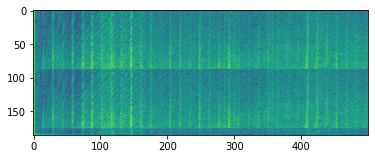

In [122]:
plt.imshow(spec[:500,:500])

In [123]:
def spectogram(audio):
    tf.signal.stft(audio)

# Network

In [136]:
base_model_xc = tf.keras.applications.Xception(
        input_shape=(*IMAGE_SIZE, 3), include_top=False, weights="imagenet")
preprocess_input_xc = keras.applications.xception.preprocess_input

83697664/83683744 [==============================] - 7s 0us/step


In [ ]:
base_model_b2 = tf.keras.applications.EfficientNetV2B2(
            input_shape=(*IMAGE_SIZE, 3), include_top=False, weights="imagenet")
preprocess_input_b2 = tf.keras.applications.efficientnet_v2.preprocess_input

In [125]:
#from kapre import STFT, Magnitude, MagnitudeToDecibel
from kapre.composed import get_stft_magnitude_layer #get_melspectrogram_layer, get_log_frequency_spectrogram_layer

In [130]:
steps_per_epoch = len(train) // BATCH_SIZE
clr = tfa.optimizers.CyclicalLearningRate(initial_learning_rate=1e-3,
    maximal_learning_rate=6e-3,
    scale_fn=lambda x: 1/(2.**(x-1)),
    step_size=2 * steps_per_epoch
)

In [71]:
#initial_learning_rate = 0.01
#lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
#    initial_learning_rate, decay_steps=20, decay_rate=0.96, staircase=True
#)

In [131]:
def make_model(base_model, preprocess_input=False):
    
    imgsize = IMAGE_SIZE[0]
    
    base_model.trainable = False

    inputs = keras.layers.Input((rng, 1))
    x = inputs
    #x = tf.keras.layers.Lambda(tf.sparse.to_dense)(inputs)
    x = get_stft_magnitude_layer(n_fft=32000, win_length=32000, hop_length=6400 )(x) 
    x = tf.stack([x[:,:,:imgsize],x[:,:,imgsize:imgsize*2],x[:,:,imgsize*2:imgsize*3]],3)
    # Data augmentation
    #x = keras.layers.Resizing(224, 224)(inputs)
    #x = keras.layers.RandomFlip("horizontal")(x)
    #x = keras.layers.RandomRotation(0.1)(x)
    #x = keras.layers.RandomZoom(0.1)(x)
    #x = keras.layers.RandomContrast(factor=0.01)(x) 
    
    # Preprocess according to the base model
    x = preprocess_input(x)
    
    # Pass through the base model
    x = base_model(x)
    
    # Head
    x = keras.layers.GlobalAveragePooling2D()(x)
    x = keras.layers.BatchNormalization(axis=-1)(x)
    x = keras.layers.Dropout(rate=0.25)(x)
    x = keras.layers.Dense(512, activation="relu")(x)
    x = keras.layers.BatchNormalization(axis=-1)(x)
    x = keras.layers.Dropout(rate=0.5)(x)

    outputs = keras.layers.Dense(5, activation="softmax")(x)

    # Create and compile the model
    model = keras.Model(inputs=inputs, outputs=outputs)

    model.compile(
        optimizer=keras.optimizers.Adam(clr),
        loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False),
        metrics="accuracy"
        #,run_eagerly=True
    )

    return model

In [137]:
model = make_model(base_model=base_model_xc, preprocess_input=preprocess_input_xc)
tf.keras.utils.plot_model(model, show_shapes=True)
model.layers[1].trainable=False
model.layers[2].trainable=False
model.layers[3].trainable=False
model.layers[4].trainable=False

# Training

In [138]:
tensorboard_callback = keras.callbacks.TensorBoard(log_dir="./logs")

In [139]:
history = model.fit(
    train_dataset,
    epochs=100,
    validation_data=test_dataset,
    callbacks=[tensorboard_callback]
)

Epoch 1/100
44/44 [==============================] - 27s 562ms/step - loss: 2.0140 - accuracy: 0.4035 - val_loss: 1.4187 - val_accuracy: 0.3250
Epoch 2/100
44/44 [==============================] - 25s 553ms/step - loss: 1.5680 - accuracy: 0.5181 - val_loss: 1.2561 - val_accuracy: 0.4500
Epoch 3/100
44/44 [==============================] - 25s 552ms/step - loss: 1.1635 - accuracy: 0.5835 - val_loss: 1.5092 - val_accuracy: 0.3667
Epoch 4/100
44/44 [==============================] - 25s 568ms/step - loss: 0.9928 - accuracy: 0.6386 - val_loss: 2.1420 - val_accuracy: 0.4250
Epoch 5/100
44/44 [==============================] - 25s 556ms/step - loss: 0.7510 - accuracy: 0.7271 - val_loss: 1.5824 - val_accuracy: 0.4083
Epoch 6/100
44/44 [==============================] - 25s 561ms/step - loss: 0.8557 - accuracy: 0.6749 - val_loss: 1.4029 - val_accuracy: 0.4000
Epoch 7/100
44/44 [==============================] - 25s 562ms/step - loss: 0.8995 - accuracy: 0.6662 - val_loss: 1.3099 - val_accuracy:

In [140]:
for i, l in enumerate(model.layers):
    print(i, l.trainable)
    l.trainable = True

0 True
1 False
2 False
3 False
4 False
5 True
6 True
7 True
8 False
9 True
10 True
11 True
12 True
13 True
14 True
15 True


In [141]:
history = model.fit(
    train_dataset,
    epochs=300,
    validation_data=test_dataset,
    callbacks=[tensorboard_callback]
)

Epoch 1/300
44/44 [==============================] - 27s 608ms/step - loss: 0.2334 - accuracy: 0.9231 - val_loss: 0.5763 - val_accuracy: 0.8250
Epoch 2/300
44/44 [==============================] - 27s 597ms/step - loss: 0.2446 - accuracy: 0.9260 - val_loss: 0.6115 - val_accuracy: 0.8000
Epoch 3/300
44/44 [==============================] - 27s 602ms/step - loss: 0.2319 - accuracy: 0.9202 - val_loss: 0.7018 - val_accuracy: 0.7250
Epoch 4/300
44/44 [==============================] - 26s 590ms/step - loss: 0.2217 - accuracy: 0.9173 - val_loss: 0.7043 - val_accuracy: 0.7083
Epoch 5/300
44/44 [==============================] - 27s 599ms/step - loss: 0.2145 - accuracy: 0.9158 - val_loss: 0.6781 - val_accuracy: 0.7333
Epoch 6/300
44/44 [==============================] - 27s 599ms/step - loss: 0.2268 - accuracy: 0.9260 - val_loss: 0.6476 - val_accuracy: 0.7667
Epoch 7/300
44/44 [==============================] - 27s 603ms/step - loss: 0.1913 - accuracy: 0.9347 - val_loss: 0.6482 - val_accuracy:

In [ ]:
model.summary()

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs

# Conclutions

It was a little struggle getting tensorflow to work.  
I am shure with some more tuning I could get the same results as with fastai.
but training time is slower, and I already have a better score with pytorch / fastai, so i will stick to that.  

Chaning model when every thing is set up is really easy though.